# Демонстраційна програма 5
## Навчання параметрів еталонів для розпізнавання тексту
### Щербакова Валерія, ФІ-11мн
(дедлайн 7 січня 2022 23:59)

*Ця робота написана в форматі IPython Notebook оскільки необхідна візуалізація та контроль всіх проміжних результатів.*

In [387]:
import numpy as np, matplotlib.pyplot as plt, imageio
from keras.datasets import mnist
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay

rng_seed = 2022

# Warning: min is 0, max is 1, not 255!!!
# N(noise_mean, noise_cov) is additively overlayed to each pixel
noise_mean, noise_cov = 0, 1  # ~= 255

# Controls behavior after applying noise overlay to image
# if True:  result is clipped to [0, 1], that is <0 -> 0, >1 -> 1 (more vivid, like bernoulli)
# if False: result is rescaled [min, max] -> [0, 1] (more gray, information is visibly obscured)
composition_clip = True

# Difficulty coefficient, alpha * x1 must be greater than difficulty * alpha * x2 for better recognition
difficulty = 1

1\. Підготувати моноширинні зображення еталонів символів (використати MNIST або моноширинний шрифт). Кількість символів - від 10 до 50.

*MNIST, 10 символів (0-9)*

Template characters picked at indexes: [9, 12, 23, 30, 68, 83, 88, 93, 99, 103]


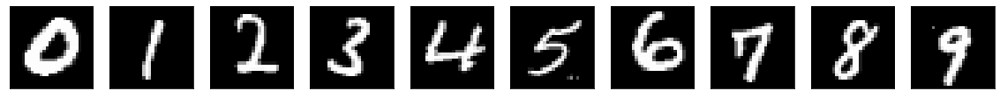

In [367]:
rng = np.random.default_rng(rng_seed)

(train_X, train_y), (test_X, test_y) = mnist.load_data()
dslen = len(train_X)
perm = rng.permutation(dslen)
shuf_X, shuf_Y = train_X[perm], train_y[perm]
cmap = plt.get_cmap('gray')

# Find and remember template images. Large size of set (60000) allows for run and grab logic.
template, curr, templidx = [], 0, []
for i in range(dslen):
    if shuf_Y[i] == curr:
        template.append(shuf_X[i] / 255.0)
        templidx.append(i)
        curr += 1
    if curr == 10:
        break

def noax(ax=None):
    if ax is None: ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    return ax

print('Template characters picked at indexes: ' + str(templidx))

plt.figure(figsize=(20,4))
for i in range(10):
    noax(plt.subplot(2, 10, i + 1))
    plt.imshow(template[i], cmap)
plt.show()

2\. Згенерувати 110 зображень строк тексту по 100 символів кожна (можна взяти для цього текст і перегенерувати з нього зображення), використовуючи обрані еталони

[4 0 1 2 2 1 5 4 2 6 0 5 2 7 2 5 4 8 1 1]
[3 0 1 6 3 5 6 4 9 8 8 0 4 9 4 5 9 4 0 7]
[6 2 4 5 5 6 4 8 7 0 8 8 5 6 8 0 9 0 9 2]
[9 3 4 4 9 6 0 4 3 0 2 6 7 4 1 9 5 8 6 3]
[5 2 4 9 7 4 9 1 7 1 5 2 3 3 7 2 1 2 6 6]


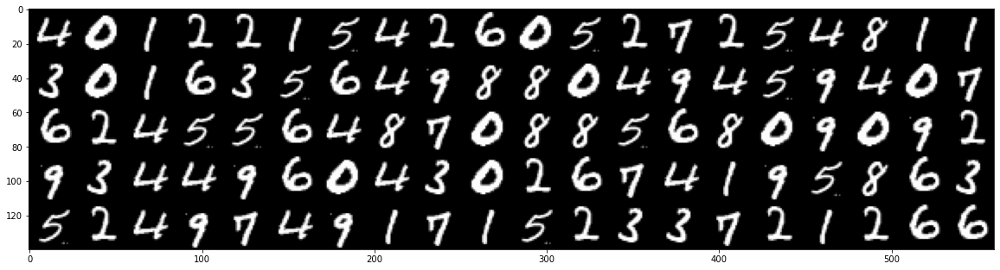

In [368]:
rng = np.random.default_rng(rng_seed + 1)
texts = rng.integers(0, 10, (110, 100))

for i in range(5):
    print(texts[i][:20])

images = np.array([np.hstack([template[j] for j in texts[i]]) for i in range(110)])

plt.figure(figsize=(20,6))
plt.imshow(np.vstack([images[i,:,:28*20] for i in range(5)]), cmap)
plt.show()

3\. Додати шум на всі згенеровані зображення (Бернулі для ч/б або адитивний Гаусовий для сірих еталонів). Параметри шумів мають бути змінювані

Sample of noise overlay (-1: red, +1: blue)


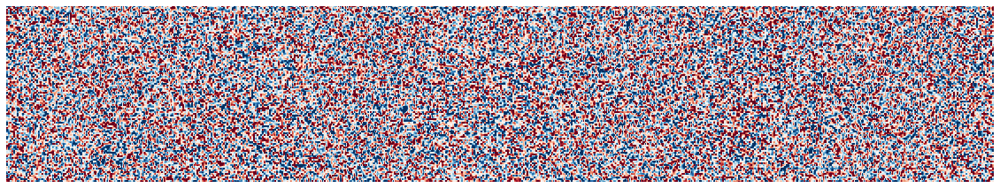

Sample of noised texts (same as previous cell)


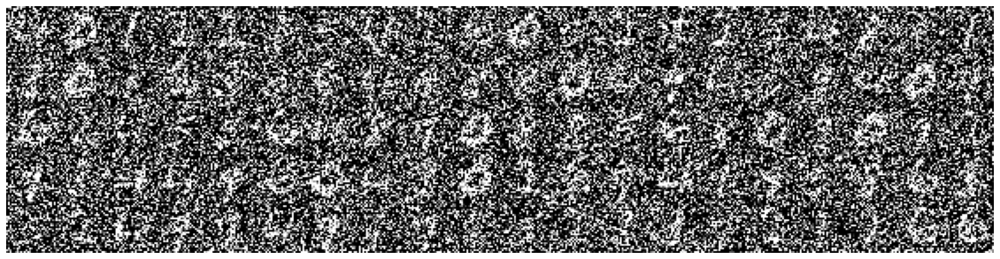

In [388]:
rng = np.random.default_rng(rng_seed + 2)
overlay = rng.normal(noise_mean, noise_cov, images.shape)
print('Sample of noise overlay (-1: red, +1: blue)')
plt.figure(figsize=(20,6))
plt.imshow(overlay[:100,0,:28*20], cmap='RdBu', vmin=-1, vmax=1)
plt.axis('off')
plt.show()

if composition_clip:
    n_images = np.clip(images + overlay, 0, 1)
else:
    n_images = images + overlay
    n_images = (n_images - np.min(n_images)) / np.ptp(n_images)
print('Sample of noised texts (same as previous cell)')
plt.figure(figsize=(20,6))
plt.imshow(np.vstack([n_images[i,:,:28*20] for i in range(5)]), cmap)
plt.axis('off')
plt.show()

4\. Використати перші 10 зображень строк тексту для навчання еталонів у припущенні, що символи, зображені на цих строках, відомі програмі що навчає еталони. Для навчання поставити задачу Фішера та розв'язати її за допомогою алгоритма персептрона чи Козинця

Iteration 1 misperceptions: 591
Iteration 2 misperceptions: 56
Iteration 3 misperceptions: 11
Iteration 4 misperceptions: 8
Iteration 5 misperceptions: 2
Iteration 6 misperceptions: 0


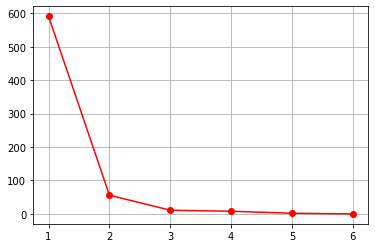

In [389]:
rng = np.random.default_rng(rng_seed + 3)

train_images = n_images[:10]
train_texts = texts[:10]

alpha = [np.zeros(template[0].shape) for i in range(10)]
pos_alpha = [np.zeros(template[0].shape) for i in range(10)]
neg_alpha = [np.zeros(template[0].shape) for i in range(10)]

def alpha_u255():
    stk1, stk2, stk3 = [np.hstack(alpha), np.hstack(pos_alpha), np.hstack(neg_alpha)]
    stk1 = 255 * (stk1 - np.min(stk1)) / np.ptp(stk1)
    stk2 = 255 * (stk2 - np.min(stk2)) / np.ptp(stk2)
    stk3 = 255 * (stk3 - np.min(stk3)) / np.ptp(stk3)
    return np.vstack([stk1, stk2, stk3]).astype(np.uint8)

with imageio.get_writer('alpha-animation.gif', mode='I', duration=0.01) as writer:
    miss_log = []
    miss, iters = 1, 0
    while miss > 0:
        miss = 0
        iters += 1
        for tx_i in range(10):
            tx_img = train_images[tx_i]
            tx_chr = train_texts[tx_i]
            for ch_i in range(100):
                img = tx_img[:,ch_i*28:(ch_i+1)*28]
                cor = tx_chr[ch_i]
                my_level = np.vdot(alpha[cor], img)
                upd = False
                for oth in range(10):
                    if cor == oth: continue
                    oth_level = np.vdot(alpha[oth], img)
                    if my_level <= oth_level * difficulty:
                        miss += 1
                        upd = True
                        alpha[cor] += img
                        alpha[oth] -= img
                        pos_alpha[cor] += img
                        neg_alpha[oth] += img
                # if upd:
                #     writer.append_data(alpha_u255())
        miss_log.append(miss)
        print('Iteration {} misperceptions: {}'.format(iters, miss))
    # for i in range(200):
    #     writer.append_data(alpha_u255())

plt.plot(range(1, iters+1), miss_log, 'r-o')
plt.grid()
plt.show()

5\. Розпізнати 100 зашумлених зображень строк тексту, що залишились, на основі навчених параметрів для класифікатора Фішера

In [390]:
test_images = n_images[10:]
test_texts = texts[10:]

# repeat alphas horizontally and multiply them over texts in one step
long_alpha = [np.hstack([alpha[i] for j in range(100)]) for i in range(10)]
pixel_levels = [long_alpha[i] * test_images for i in range(10)]

test_recons = []  # recon - recognized / reconstructed
test_levels = []
# collect values over characters
for tx_i in range(100):
    tx_img = test_images[tx_i]
    tx_chr = []
    tx_lvs = []
    for ch_i in range(100):
        levels = [ sum(sum(pixel_levels[i][tx_i][:,ch_i*28:(ch_i+1)*28])) for i in range(10) ]
        tx_chr.append(np.argmax(levels))
        tx_lvs.append(levels)
    test_recons.append(tx_chr)
    test_levels.append(tx_lvs)

test_recons = np.array(test_recons)
test_levels = np.array(test_levels)

6\. Вивести результати розпізнавання (зашумлені зображення і відповідний розпізнаний текст; розпізнаний текст бажано виводити в вигляді зображень, побудованих на відповідних незашумлених еталонах)

Для початку для наочного представлення точності розпізнавання я побудую та виведу матрицю невідповідностей розпізнавання.

Accuracy: 0.9511


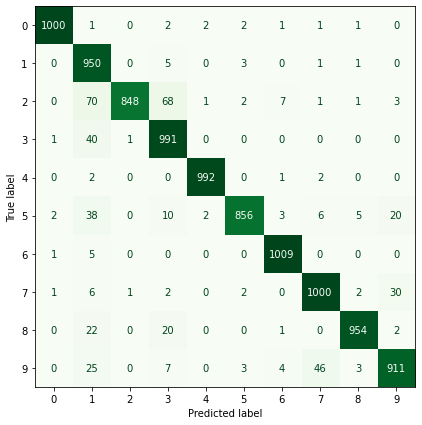

In [391]:
flat_texts = test_texts.ravel()
flat_recons = test_recons.ravel()

print('Accuracy:', accuracy_score(flat_texts, flat_recons))

plt.figure(figsize=(7,7))
ConfusionMatrixDisplay.from_predictions(flat_texts, flat_recons, cmap='Greens', ax=plt.gca(), colorbar=False)
plt.show()

Тепер згідно завдання виведу тексти та розпізнані символи.

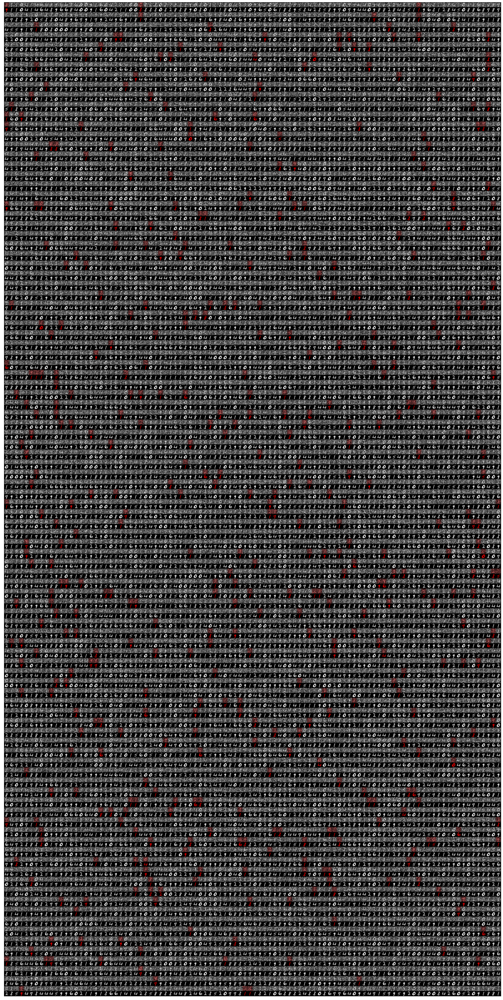

In [392]:
# grayscale -> rgb for coloring errors
def chan3(img): return np.stack((img,)*3, axis=-1)

tower = []

hardred = np.array([1,0,0])
softred = np.array([1,0.5,0.5])

for tx_i in range(100):
    img = test_images[tx_i]
    layer1 = chan3(img)
    layer2 = chan3(np.hstack([template[j] for j in test_recons[tx_i]]))
    for ch_i in range(100):
        if test_recons[tx_i][ch_i] != test_texts[tx_i][ch_i]:
            layer1[:,ch_i*28:(ch_i+1)*28] *= softred
            layer2[:,ch_i*28:(ch_i+1)*28] *= hardred
    tower.append(layer1), tower.append(layer2)

plt.figure(figsize=(25,50))
plt.imshow(np.vstack(tower))
noax()
plt.show()

7\. Вивести еталони, що були знайдені, у вигляді зображень


Resulting alphas (simple perception and positive-negative decomposition):
Red represents negative values (<0), blue represents positive values (>0)


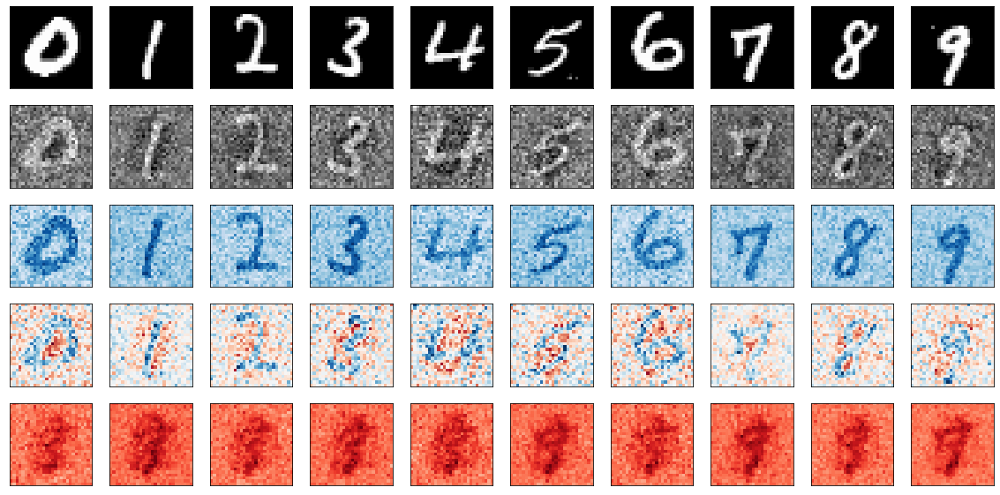

In [393]:
print('\nResulting alphas (simple perception and positive-negative decomposition):')
print('Red represents negative values (<0), blue represents positive values (>0)')

plt.figure(figsize=(20,10))
for i in range(10):
    # Align around 0 to correctly use red-blue color map
    msk_min, msk_max = np.min(alpha[i]), np.max(alpha[i])
    msk_min, msk_max = min(msk_min, -msk_max), max(msk_max, -msk_min)
    noax(plt.subplot(5, 10, i +  1)), plt.imshow(template[i], cmap)
    noax(plt.subplot(5, 10, i + 11)), plt.imshow(alpha[i], cmap)
    noax(plt.subplot(5, 10, i + 21)), plt.imshow(pos_alpha[i], cmap='Blues', vmin=0)
    noax(plt.subplot(5, 10, i + 31)), plt.imshow(alpha[i], cmap='RdBu', vmin=msk_min, vmax=msk_max)
    noax(plt.subplot(5, 10, i + 41)), plt.imshow(neg_alpha[i], cmap='Reds', vmin=0)
plt.show()